Importing Necessary Libraries

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np
import pandas as pd 
import os
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_io as tfio
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten
from itertools import groupby
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import librosa #To deal with Audio files
import librosa.display
import IPython.display as ipd


## Building a Function to Load the data
### Defining file Path

In [3]:
CAPUCHIN_FILE = os.path.join('/kaggle/input','z-by-hp-unlocked-challenge-3-signal-processing','Parsed_Capuchinbird_Clips','XC3776-3.wav')
NOT_CAPUCHIN_FILE= os.path.join('/kaggle/input','z-by-hp-unlocked-challenge-3-signal-processing','Parsed_Not_Capuchinbird_Clips','afternoon-birds-song-in-forest-0.wav')

In [4]:
path0 = '../input/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/'
path1 = '../input/z-by-hp-unlocked-challenge-3-signal-processing/Parsed_Capuchinbird_Clips/'
path2 = '../input/z-by-hp-unlocked-challenge-3-signal-processing/Parsed_Not_Capuchinbird_Clips/'

### Visualizing the Audio file

In [5]:
def visulize_random_sample(folder_name):
    #to hear the audio sample
    rand_sample             = np.random.randint(0,len(os.listdir(folder_name)))
    sample_sound              = os.listdir(folder_name)[rand_sample]
    sample_address            = folder_name + sample_sound
    sample_sound, sample_rate = librosa.load(sample_address)
    final_audio              = ipd.Audio(sample_sound, rate=sample_rate)
    return final_audio

Visualizing the Forest Recordings

In [6]:
visulize_random_sample(path0)


/opt/conda/lib/python3.7/site-packages/librosa/util/decorators.py:88: UserWarning: PySoundFile failed. Trying audioread instead.
  return f(*args, **kwargs)


Visualizing the Parsed_Capuchinbird_Clips

In [7]:
visulize_random_sample(path1)


Visualizing the Parsed_Not_Capuchinbird_Clips

In [8]:
visulize_random_sample(path2)


## Building function for Loading the Data

In [9]:
def load_wav_16k_mono(file):
    # Load encoded wav file
    file_contents = tf.io.read_file(file)
    # Decode wav (tensors by channels) 
    wav_file, sample_rate = tf.audio.decode_wav(file_contents, desired_channels=1)
    # Removes trailing axis
    wav_file = tf.squeeze(wav_file, axis=-1)
    sample_rate = tf.cast(sample_rate, dtype=tf.int64)
    # Goes from 44100Hz to 16000hz - amplitude of the audio signal
    wav_file = tfio.audio.resample(wav_file, rate_in=sample_rate, rate_out=16000)
    return wav_file

Decoded version of our WAV file

In [10]:
file_contents = tf.io.read_file(CAPUCHIN_FILE)
print(file_contents)


tf.Tensor(b'RIFF\xbc\t\x04\x00WAVEfmt \x10\x00\x00\x00\x01\x00\x01\x00D\xac\x00\x00\x88X\x01\x00\x02\x00\x10\x00data\x98\t\x04\x00\xc5\xf1(\xfb\x7f\x07F\x13|\x1c\xa3$\x07.R8\x03A\xbaF\xb6J\xb4NQR\x92S\x95Q\xa1M/I\xb3CJ;\x88/\xa2"X\x17\x12\x0e\xce\x04\xdd\xf9\x07\xeei\xe3\xc3\xda\xa5\xd2\xae\xc9\xc4\xc0P\xbaB\xb7\xb5\xb5-\xb3\xaa\xaf\xad\xad\x00\xafd\xb22\xb5\xeb\xb6\xf5\xb9m\xc0\x1e\xc9\xc6\xd0-\xd6\xba\xdbO\xe4[\xefG\xf9\xd2\xff\xc3\x04\x87\x0b\xec\x14m\x1e\xc6%\xc4+\xb22\xa3:\xd7@\x17C\x86B8BoC[D\xc5B\xda>\x9e:\x117\xeb2`,_#\x93\x19\x82\x10X\x08M\x00\xb2\xf7j\xee\t\xe5\xc1\xdc\xbc\xd6\xf3\xd2\xeb\xcfV\xcc\x1c\xc9\xc5\xc8b\xcc\x95\xd1\xe6\xd4\xe4\xd5\xda\xd7\xb2\xdd\x13\xe6\xf3\xec\xc8\xf0\x99\xf4\x00\xfc@\x06\xed\x0eX\x13\x94\x154\x19:\x1e!!\xcb\x1fj\x1cu\x1a\xdd\x19A\x17\xd6\x100\t\t\x04f\x01\xd3\xfd_\xf7\x84\xf0\xf7\xec\xb5\xec\x16\xec\xc1\xe8\xd8\xe4.\xe4V\xe72\xeb<\xed\xad\xeeb\xf2\xc1\xf8E\xff\x00\x04\x04\x08t\r!\x14\x83\x19\xfe\x1b\xd6\x1cJ\x1e\xa2 3"\x15"v!\xb7!("\xc4 \xed\x1c

2022-12-16 22:09:01.136655: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


In [11]:
wav_file, sample_rate = tf.audio.decode_wav(file_contents, desired_channels=1)
print(wav_file)
print('-------')
print(sample_rate)

tf.Tensor(
[[-0.11117554]
 [-0.0378418 ]
 [ 0.05856323]
 ...
 [-0.01077271]
 [-0.03436279]
 [-0.04879761]], shape=(132300, 1), dtype=float32)
-------
tf.Tensor(44100, shape=(), dtype=int32)


We are getting the tensor with the shape of 132300 with 1 channel

In [12]:
wav_file = tf.squeeze(wav_file, axis=-1)
sample_rate = tf.cast(sample_rate, dtype=tf.int64)
# Goes from 44100Hz to 16000hz - amplitude of the audio signal
wav_file = tfio.audio.resample(wav_file, rate_in=sample_rate, rate_out=16000)

2022-12-16 22:09:01.342552: I tensorflow_io/core/kernels/cpu_check.cc:128] Your CPU supports instructions that this TensorFlow IO binary was not compiled to use: AVX2 FMA
2022-12-16 22:09:01.560858: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


In [13]:
len(wav_file)

48000

## Plotting Wave

In [14]:
wave = load_wav_16k_mono(CAPUCHIN_FILE)
nwave = load_wav_16k_mono(NOT_CAPUCHIN_FILE)

In [15]:
len(wave)

48000

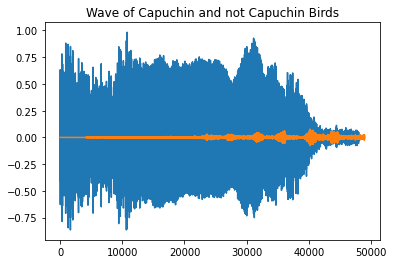

In [16]:
plt.title('Wave of Capuchin and not Capuchin Birds')
plt.plot(wave)
plt.plot(nwave)
plt.show()

Blue is the audio wave of Capuchin birds and Orange is the audio wave of non capuchin birds

### Defining paths to positive and negative data

In [17]:
POS=os.path.join('/kaggle/input','z-by-hp-unlocked-challenge-3-signal-processing','Parsed_Capuchinbird_Clips')
NEG=os.path.join('/kaggle/input','z-by-hp-unlocked-challenge-3-signal-processing','Parsed_Not_Capuchinbird_Clips')

In [18]:
print('Positive data Path: ', POS)
print('Negative data Path: ', NEG)

Positive data Path:  /kaggle/input/z-by-hp-unlocked-challenge-3-signal-processing/Parsed_Capuchinbird_Clips
Negative data Path:  /kaggle/input/z-by-hp-unlocked-challenge-3-signal-processing/Parsed_Not_Capuchinbird_Clips


### Loading the dataset in Tensorflow format

In [19]:
pos=tf.data.Dataset.list_files(POS+'/*.wav')
neg=tf.data.Dataset.list_files(NEG+'/*.wav')

In [20]:
print(pos)
print(neg)

<ShuffleDataset shapes: (), types: tf.string>
<ShuffleDataset shapes: (), types: tf.string>


In [21]:
pos.as_numpy_iterator().next()

b'/kaggle/input/z-by-hp-unlocked-challenge-3-signal-processing/Parsed_Capuchinbird_Clips/XC216012-5.wav'

Add labels and combin positive and negative samples

In [22]:
len(pos)

217

In [23]:
tf.ones(len(pos))

<tf.Tensor: shape=(217,), dtype=float32, numpy=
array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1

In [24]:
len(neg)

593

In [25]:
tf.zeros(len(neg))

<tf.Tensor: shape=(593,), dtype=float32, numpy=
array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0

We are labeling 1 for the postive data which says this is the sound of Capuchin bird and 0 as non capuchin birds

In [26]:
positives = tf.data.Dataset.zip((pos, tf.data.Dataset.from_tensor_slices(tf.ones(len(pos)))))
negatives = tf.data.Dataset.zip((neg, tf.data.Dataset.from_tensor_slices(tf.zeros(len(neg)))))
data = positives.concatenate(negatives)

In [27]:
print(len(positives))
print(len(negatives))
print(len(data))

217
593
810


In [28]:
positives.as_numpy_iterator().next()

(b'/kaggle/input/z-by-hp-unlocked-challenge-3-signal-processing/Parsed_Capuchinbird_Clips/XC216010-1.wav',
 1.0)

WE can see it clearly that it is showing 1 instead of .wav file

## Determine Average Length of a Capuchin Call
### Calculate Wave Cycle Length

In [29]:
lengths=[]
for file in os.listdir(os.path.join('/kaggle/input','z-by-hp-unlocked-challenge-3-signal-processing','Parsed_Capuchinbird_Clips')):
    #we are using load_wav_16k_mono function to load thee data set in the wav form
    tensor_wave=load_wav_16k_mono(os.path.join('/kaggle/input','z-by-hp-unlocked-challenge-3-signal-processing','Parsed_Capuchinbird_Clips',file))
    lengths.append(len(tensor_wave))

In [30]:
#printing all the files in our Parsed capuchin bird directory
os.listdir(os.path.join('/kaggle/input','z-by-hp-unlocked-challenge-3-signal-processing','Parsed_Capuchinbird_Clips'))

['XC27882-2.wav',
 'XC227469-2.wav',
 'XC456236-3.wav',
 'XC227471-6.wav',
 'XC227468-3.wav',
 'XC513083-1.wav',
 'XC216012-12.wav',
 'XC9892-0.wav',
 'XC27882-0.wav',
 'XC227469-3.wav',
 'XC433953-10.wav',
 'XC79965-10.wav',
 'XC526106-4.wav',
 'XC46241-4.wav',
 'XC600460-0.wav',
 'XC201990-4.wav',
 'XC388470-5.wav',
 'XC114132-4.wav',
 'XC227471-3.wav',
 'XC9221-0.wav',
 'XC433953-8.wav',
 'XC46241-1.wav',
 'XC178168-4.wav',
 'XC216012-19.wav',
 'XC395129-4.wav',
 'XC227468-2.wav',
 'XC46241-2.wav',
 'XC216012-3.wav',
 'XC216010-7.wav',
 'XC216012-8.wav',
 'XC65196-2.wav',
 'XC3776-4.wav',
 'XC3776-2.wav',
 'XC526106-0.wav',
 'XC456236-0.wav',
 'XC3776-3.wav',
 'XC114132-5.wav',
 'XC27882-5.wav',
 'XC178168-2.wav',
 'XC79965-2.wav',
 'XC307385-0.wav',
 'XC600460-1.wav',
 'XC9221-1.wav',
 'XC433953-9.wav',
 'XC16804-0.wav',
 'XC178167-1.wav',
 'XC388470-6.wav',
 'XC456236-1.wav',
 'XC22397-1.wav',
 'XC216012-0.wav',
 'XC216010-1.wav',
 'XC227468-5.wav',
 'XC216012-4.wav',
 'XC433953-2

In [31]:
print(lengths)

[64000, 48000, 48000, 56000, 56000, 64000, 48000, 56000, 64000, 56000, 55999, 72000, 48000, 56000, 56000, 40000, 40000, 56000, 56000, 64000, 32000, 56000, 64000, 40000, 48000, 64000, 56000, 40000, 64000, 48000, 56000, 64000, 56000, 56000, 56000, 48000, 48000, 56000, 56000, 72000, 48000, 48000, 64000, 39999, 64000, 56000, 64000, 56000, 40000, 64000, 56000, 56000, 56000, 48000, 64000, 48000, 56000, 72000, 40000, 48000, 40000, 48000, 64000, 48000, 64000, 56000, 48000, 64000, 48000, 64000, 56000, 56000, 56000, 56000, 56000, 48000, 48000, 40000, 48000, 64000, 56000, 40000, 56000, 32000, 56000, 48000, 64000, 64000, 56000, 56000, 56000, 48000, 56000, 56000, 64000, 56000, 48000, 48000, 64000, 40000, 56000, 48000, 56000, 56000, 48000, 56000, 48000, 72000, 56000, 56000, 48000, 40000, 48000, 64000, 56000, 64000, 48000, 56000, 56000, 56000, 56000, 48000, 64000, 48000, 56000, 40000, 48000, 56000, 56000, 48000, 56000, 48000, 56000, 48000, 48000, 56000, 72000, 48000, 56000, 64000, 56000, 64000, 56000

### Calculate Mean, Min and Max

In [32]:
tf.math.reduce_mean(lengths)


<tf.Tensor: shape=(), dtype=int32, numpy=54156>

In [33]:
54156/16000

3.38475

In [34]:
tf.math.reduce_min(lengths)


<tf.Tensor: shape=(), dtype=int32, numpy=32000>

In [35]:
32000/16000

2.0

In [36]:
tf.math.reduce_max(lengths)


<tf.Tensor: shape=(), dtype=int32, numpy=80000>

In [37]:
80000/16000

5.0

We have a mean sound of 3.38475 sec, minimun is 2 sec and max is 5 sec of our capuchin bird sound in our file 

## Build Preprocessing Function to Convert to Spectrogram
A spectrogram is a visual way of representing the signal strength, or “loudness”, of a signal over time at various frequencies present in a particular waveform.


In [38]:
def preprocess(file_path, label): 
    wav = load_wav_16k_mono(file_path)
    wav = wav[:48000]
    zero_padding = tf.zeros([48000] - tf.shape(wav), dtype=tf.float32)
    wav = tf.concat([zero_padding, wav],0)
    spectrogram = tf.signal.stft(wav, frame_length=320, frame_step=32)
    spectrogram = tf.abs(spectrogram)
    spectrogram = tf.expand_dims(spectrogram, axis=2)
    return spectrogram, label

### Testing  the Function and Visualizing the Spectrogram
#### plotting postive data spectogram 

In [39]:
filepath, label = positives.shuffle(buffer_size=10000).as_numpy_iterator().next()


In [40]:
spectrogram, label = preprocess(filepath, label)


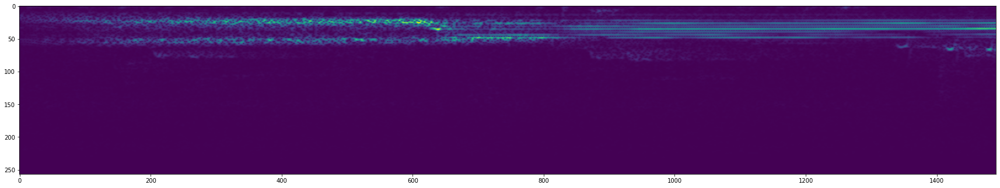

In [41]:
plt.figure(figsize=(30,20))
plt.imshow(tf.transpose(spectrogram)[0])
plt.show()

### Plotting the Negative spectogram

In [42]:
filepath, label = negatives.shuffle(buffer_size=10000).as_numpy_iterator().next()


In [43]:
spectrogram, label = preprocess(filepath, label)


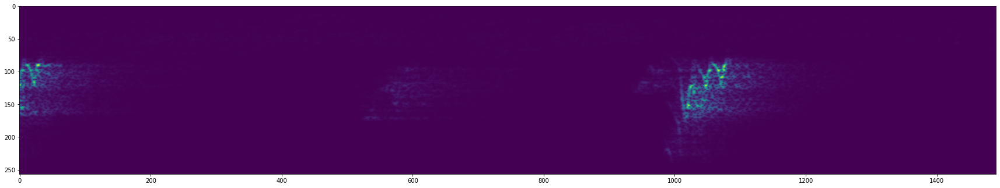

In [44]:
plt.figure(figsize=(30,20))
plt.imshow(tf.transpose(spectrogram)[0])
plt.show()

### Creating a Tensorflow Data Pipeline

In [45]:
data = data.map(preprocess)
data = data.cache()
data = data.shuffle(buffer_size=1000)
data = data.batch(16)
data = data.prefetch(8)

### Split data into Training and Testing Set

In [46]:
len(data)

51

In [47]:
51 * .7

35.699999999999996

We will take 70 percent of our data into training and remaining data into test which will be 36 for training and 15 for test

In [48]:
train = data.take(36)
test = data.skip(36).take(15)

### Test One Batch


In [49]:
samples, labels = train.as_numpy_iterator().next()


2022-12-16 22:09:24.982381: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 391 of 1000
2022-12-16 22:09:34.968084: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:175] Filling up shuffle buffer (this may take a while): 768 of 1000
2022-12-16 22:09:36.108816: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:228] Shuffle buffer filled.


In [50]:
samples.shape


(16, 1491, 257, 1)

We will be using this shape for modeling our deep neural network

## Building our Deep Learning Model

In [51]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten


In [52]:


#Build Sequential Model, Compile and View Summary
model = Sequential()
model.add(Conv2D(16, (3,3), activation='relu', input_shape=(1491, 257,1)))
model.add(Conv2D(16, (3,3), activation='relu'))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [53]:
model.compile('Adam', loss='BinaryCrossentropy', metrics=[tf.keras.metrics.Recall(),tf.keras.metrics.Precision()])


In [54]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 1489, 255, 16)     160       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 1487, 253, 16)     2320      
_________________________________________________________________
flatten (Flatten)            (None, 6019376)           0         
_________________________________________________________________
dense (Dense)                (None, 128)               770480256 
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 129       
Total params: 770,482,865
Trainable params: 770,482,865
Non-trainable params: 0
_________________________________________________________________


In [55]:
hist = model.fit(train, epochs=4, validation_data=test)


Epoch 1/4
36/36 [==============================] - 109s 3s/step - loss: 3.7930 - recall: 0.8616 - precision: 0.8155 - val_loss: 0.4274 - val_recall: 0.8136 - val_precision: 0.9600
Epoch 2/4
36/36 [==============================] - 107s 3s/step - loss: 0.0568 - recall: 0.9932 - precision: 0.9608 - val_loss: 0.0036 - val_recall: 1.0000 - val_precision: 1.0000
Epoch 3/4
36/36 [==============================] - 112s 3s/step - loss: 0.0286 - recall: 0.9859 - precision: 0.9929 - val_loss: 0.0482 - val_recall: 1.0000 - val_precision: 1.0000
Epoch 4/4
36/36 [==============================] - 106s 3s/step - loss: 0.0270 - recall: 0.9931 - precision: 1.0000 - val_loss: 0.0073 - val_recall: 1.0000 - val_precision: 1.0000


### plotting  View ,Loss and KPI Plots

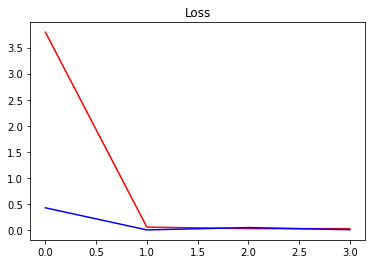

In [56]:
plt.title('Loss')
plt.plot(hist.history['loss'], 'r')
plt.plot(hist.history['val_loss'], 'b')
plt.show()

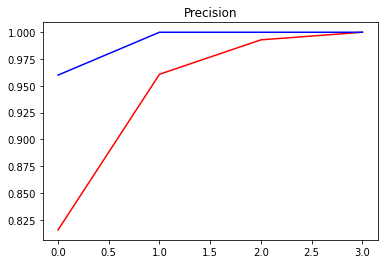

In [57]:
plt.title('Precision')
plt.plot(hist.history['precision'], 'r')
plt.plot(hist.history['val_precision'], 'b')
plt.show()


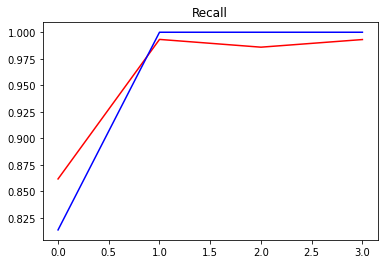

In [58]:
plt.title('Recall')
plt.plot(hist.history['recall'], 'r')
plt.plot(hist.history['val_recall'], 'b')
plt.show()

### Making Prediction on a Single Clip
### Get One Batch and Make a Prediction

In [59]:
X_test, y_test = test.as_numpy_iterator().next()


In [60]:
print(X_test)

[[[[3.48293781e-03]
   [3.58852325e-03]
   [3.43514304e-03]
   ...
   [3.07081136e-05]
   [1.95453758e-05]
   [1.56983733e-05]]

  [[1.82164833e-04]
   [9.33416668e-05]
   [2.59134482e-04]
   ...
   [8.68459483e-06]
   [3.24995904e-06]
   [2.90572643e-07]]

  [[1.03299506e-04]
   [2.13650012e-04]
   [2.83960602e-04]
   ...
   [1.15148532e-05]
   [3.15953457e-06]
   [6.54719770e-07]]

  ...

  [[1.45259313e-04]
   [4.49652507e-05]
   [2.26305565e-04]
   ...
   [3.29625851e-04]
   [1.51108077e-04]
   [8.41272995e-05]]

  [[7.10594468e-05]
   [1.36498566e-04]
   [1.46740436e-04]
   ...
   [2.41588888e-04]
   [9.96581439e-05]
   [2.07903795e-05]]

  [[2.00882321e-04]
   [8.61259032e-05]
   [3.38657730e-04]
   ...
   [1.56561786e-04]
   [7.94740336e-05]
   [3.44507862e-05]]]


 [[[6.53982628e-04]
   [4.15680901e-04]
   [4.41019802e-04]
   ...
   [5.05324824e-05]
   [7.28784435e-05]
   [4.12152149e-05]]

  [[1.94941880e-04]
   [2.70174409e-04]
   [9.34182026e-05]
   ...
   [1.53461835e-04]
 

In [61]:
print(X_test.shape)
print(y_test.shape)

(16, 1491, 257, 1)
(16,)


In [62]:
yhat = model.predict(X_test)


### Converting Logits to Classes

In [63]:
yhat = []
for prediction in yhat:
    if prediction > 0.5:
        yhat.append(1)
    else:
        yhat.append(0)
        


In [64]:
yhat

[]

In [65]:
tf.math.reduce_sum(yhat)

<tf.Tensor: shape=(), dtype=float32, numpy=0.0>

In [66]:
tf.math.reduce_sum(y_test)

<tf.Tensor: shape=(), dtype=float32, numpy=6.0>

### Load up MP3s

In [67]:
def load_mp3_16k_mono(filename):
    """ Load a WAV file, convert it to a float tensor, resample to 16 kHz single-channel audio. """
    res = tfio.audio.AudioIOTensor(filename)
    # Convert to tensor and combine channels 
    tensor = res.to_tensor()
    tensor = tf.math.reduce_sum(tensor, axis=1) / 2 
    # Extract sample rate and cast
    sample_rate = res.rate
    sample_rate = tf.cast(sample_rate, dtype=tf.int64)
    # Resample to 16 kHz
    wav = tfio.audio.resample(tensor, rate_in=sample_rate, rate_out=16000)
    return wav

In [68]:
mp3 = os.path.join('/kaggle/input','z-by-hp-unlocked-challenge-3-signal-processing', 'Forest Recordings', 'recording_00.mp3')


In [69]:
wav = load_mp3_16k_mono(mp3)


In [70]:
audio_slices = tf.keras.utils.timeseries_dataset_from_array(wav, wav, sequence_length=48000, sequence_stride=48000, batch_size=1)


In [71]:
samples, index = audio_slices.as_numpy_iterator().next()


### Building functions to Convert Clips into Windowed Spectrograms

In [72]:
def preprocess_mp3(sample, index):
    sample = sample[0]
    zero_padding = tf.zeros([48000] - tf.shape(sample), dtype=tf.float32)
    wav = tf.concat([zero_padding, sample],0)
    spectrogram = tf.signal.stft(wav, frame_length=320, frame_step=32)
    spectrogram = tf.abs(spectrogram)
    spectrogram = tf.expand_dims(spectrogram, axis=2)
    return spectrogram

###  Converting Longer audio Clips and Making Predictions

In [73]:
audio_slices = tf.keras.utils.timeseries_dataset_from_array(wav, wav, sequence_length=16000, sequence_stride=16000, batch_size=1)
audio_slices = audio_slices.map(preprocess_mp3)
audio_slices = audio_slices.batch(64)


In [74]:
yhat = model.predict(audio_slices)
yhat = [1 if prediction > 0.5 else 0 for prediction in yhat]

### Group Consecutive Detections

In [75]:
from itertools import groupby


In [76]:
yhat = [key for key, group in groupby(yhat)]
calls = tf.math.reduce_sum(yhat).numpy()

In [77]:
calls


27

### looping over all recordings and making predictions

In [78]:
results = {}
for file in os.listdir(os.path.join('/kaggle/input','z-by-hp-unlocked-challenge-3-signal-processing', 'Forest Recordings')):
    FILEPATH = os.path.join('/kaggle/input','z-by-hp-unlocked-challenge-3-signal-processing','Forest Recordings', file)
    
    wav = load_mp3_16k_mono(FILEPATH)
    audio_slices = tf.keras.utils.timeseries_dataset_from_array(wav, wav, sequence_length=48000, sequence_stride=48000, batch_size=1)
    audio_slices = audio_slices.map(preprocess_mp3)
    audio_slices = audio_slices.batch(64)
    
    yhat = model.predict(audio_slices)
    
    results[file] = yhat

### Convert Predictions into Classes

In [79]:
class_preds = {}
for file, logits in results.items():
    class_preds[file] = [1 if prediction > 0.99 else 0 for prediction in logits]


### Group Consecutive Detections

In [80]:
postprocessed = {}
for file, scores in class_preds.items():
    postprocessed[file] = tf.math.reduce_sum([key for key, group in groupby(scores)]).numpy()


###  Exporting Results into csv file

In [81]:
import csv

with open('results.csv', 'w', newline='') as f:
    writer = csv.writer(f, delimiter=',')
    writer.writerow(['recording', 'capuchin_calls'])
    for key, value in postprocessed.items():
        writer.writerow([key, value])

In [82]:
results  = pd.read_csv('/kaggle/working/results.csv')
results.head(20)

,recording,capuchin_calls
0,recording_76.mp3,0
1,recording_62.mp3,1
2,recording_48.mp3,4
3,recording_44.mp3,1
4,recording_45.mp3,12
5,recording_06.mp3,12
6,recording_43.mp3,6
7,recording_68.mp3,1
8,recording_95.mp3,5
9,recording_17.mp3,2


### Saving our model 

In [83]:
model.save('4epoch.h5')
